# Data Export - 20210607

## Intro to Dataset

This notebook contains the transformations from raw data and some annotation to help with analysis. I've included a basic write of the methods for clarity. All individuals are age matched and sex matched(female) f1s from outbred(female) cross inbred(male). Treatments are 500μM rotenone(R) and + 12% sucrose for high sugar (HS). The genotype data is GATK best practices with MAF > 0.05. Relatedness matrices are generated using GATK on the outbred genotypes. For the behavioral traits -- everything is unfiltered. Be careful that everything is in terms of pixels and frames. For example, distance travelled is currently in pixels and is just the sum of speeds (so we want to divide by 10 to get real distance travelled and then by another scaling factor later when we want to convert to a real unit like mm). Be careful to check my work on mapping to metadata to make sure there are no obvious mistakes.

![ExperimentalDesign.png](notebook_files/ExperimentalDesign.png)
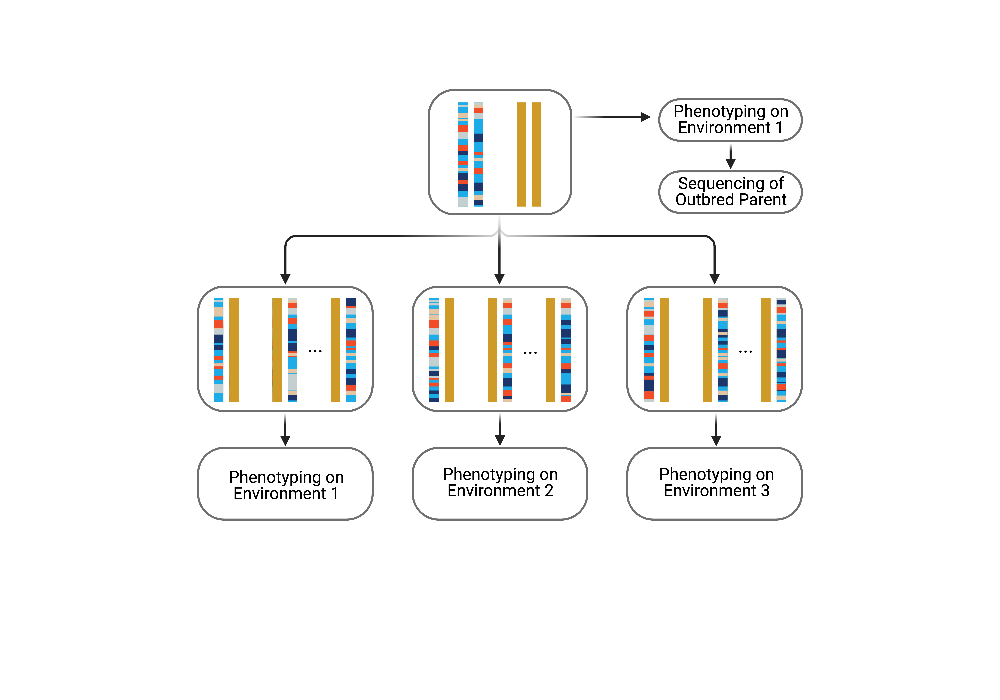

## IMAGING:
Behavioral tracking experiments were performed in custom-designed acrylic plates in .an enclosed imaging box. Each plate consists of 111 individual wells housing an individual atop gelled food (Figure). Each well is 15mm in diameter with a 12mm deep food layer and has a 3mm open layer to allow free movement. The final mesh layer allows for quick loading and reduces condensation. Light pads (Huion) were used to generate uniform underlighting. A Basler camera (acA3088-57um; 3088x2064) paired with a Tamron lens(M23FM16) was used to record three plates at a time at 10 fps. Motif (LoopBio) was used for recording with real-time compression.

## BEHAVIORAL TRACKING:
After imaging, the MARGO GUI was used to segment our spatial regions of interest(ROIs) by manually drawing a grid over each plate in a given video (Werkhoven, Rohrsen, Qin, Brembs, & Bivort, 2019). These ROIs were exported from MATLAB to CSV as bounding points. Subsequently, we trained a deep convolutional network to detect body parts(head and abdomen) for each individual within each video using SLEAP (Pereira et al., 2020). SLEAP was trained with 100 images. All training and inference was performed on a single NVIDIA Tesla P100 GPU. While SLEAP is exceptionally effective at this task, the current methods for maintaining identity are slow when processing images with many individuals. Because of the length of videos and count of individuals, 1,296,000 frames per video, and a possible maximum of 333 individuals per video, this problem is exacerbated. To avoid this, we take each instance in a given frame and map it back to the ROIs generated from MARGO, and extract centroids and part locations. Following this, we map each track to the appropriate ROI, experimental metadata(treatment, camera, batch, start time, etc), and subset our data to the temporal region of interest. To infill missing data, we ran the first pass of forward filling to followed by backfilling to remove any leading missing values.

Using the centroid and parts data, we are able to generate a suite of behavioral metrics that capture many axes of behavioral variation. One of the most direct methods is to segment movement bouts out. We utilize a two-state Hidden Markov Model (HMM) implemented in the pomegrante package to segment our data which closely mirrored hand-annotated movement bout segmentation within our dataset. We should also note that we use speed parallel and speed perpendicular along with more traditional speed. As described by Tao et al., V_par, V_perp are closely related to speed and angular speed (Tao, Ozarkar, Beck, & Bhandawat, 2019).


![ExampleTracking.png](notebook_files/ExampleTracking.png)

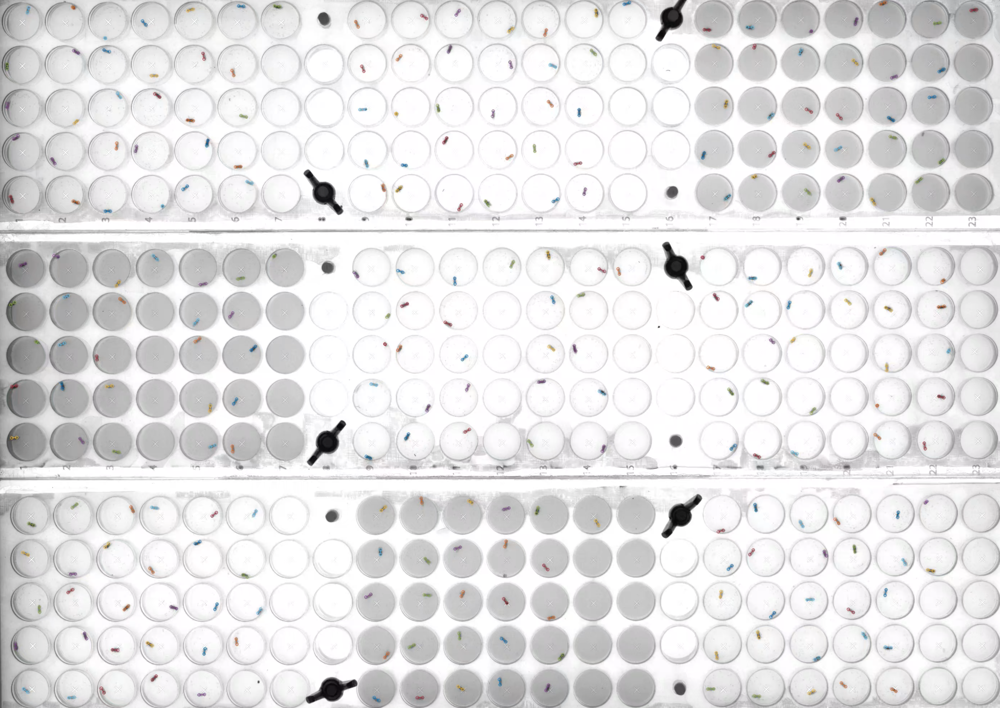


![VparVperp_Definition.png](notebook_files/VparVperp_Definition.png)
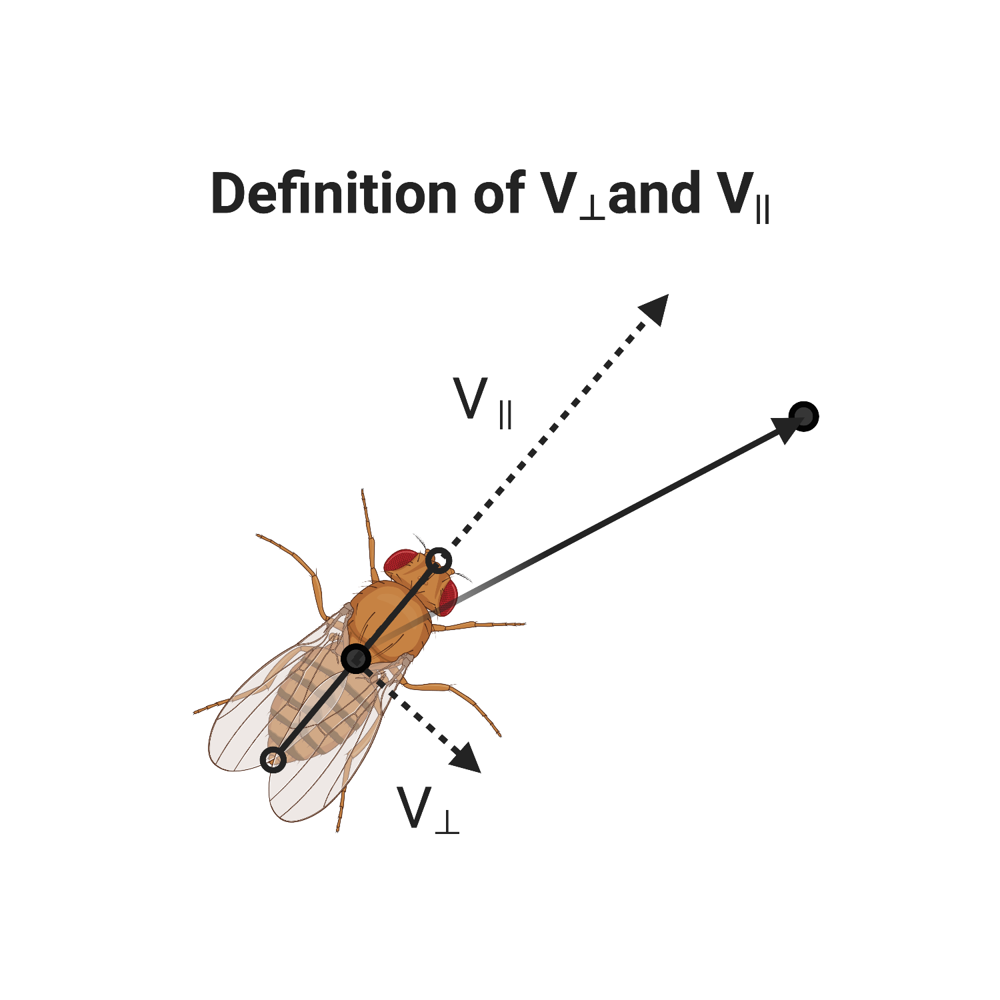

# Basic R Pipeline

## DataFrame Info:
### Metadata:
| Column ID   | Real Name | Description |
| ----------- | ----------- | ------------|
| Well_orderAsTracked      | Camera-wise Well Number        | The well(in the camera FoV) that this individual is in. |
| Treatment   | Treatment        | Treatment -- Control(C), High Sugar(HS), R(Rotenone) | 
| Empty   | Is Empty?        | Is the well marked as empty in our metadata? Note that this is occasionally used to denote wells will multiple flies so movement in some happens. |
| Male   | Is Male?        | For parents, is this a male parent? |
| Plate   | Plate        | We have 9 different plates -- which one is this individual in? |
| Family   | Family       | What family does this individual belong to? |
| StartTime   | Start time       | The real start time (difference between StartTime and 20:00 gives burn in period) |
| Batch   | What batch is this from?        | We have 5 batches included here -- which one is this individual from? |
| Camera   | Camera ID       | What camera recorded this individual |
| Batch   | What batch is this from?        | We have 5 batches included here -- which one is this individual from? |

Here are some metrics that might be worth looking at -- specifically the first 4:

| Column ID   | Real Name | Description |
| ----------- | ----------- | ------------|
| movement_count      | Count of movement bouts       | Number of movement bouts as described above |
| mean_movement_length   | Mean length of movement bout        | Mean length of a bout in frames | 
| speed_in_movement_mean     | Mean speed in movement bout       | Mean speed within bouts given in px/s |


Slightly less clear metrics that are still interesting!

| Column ID   | Real Name | Description |
| ----------- | ----------- | ------------|
| speed_in_movement_var      | Variance of speed when in movement bout       | As before except variance |
| vel_par_in_movement_mean  | Mean parallel velocity in movement bout        | Mean parallel velocity in movement bout -- should closely mirror speed | 
| var_sleep_length      | Variance of sleep length        | Sleep bouts are when not in a movement bout -- this is just the variance of the length |
| vel_perp_in_movement_mean  | Mean perpendicular velocity in movement bout         | In px and not scaled for framerate | 

There are also _mean, _std, _var for most of the metrics even when not listed here.


In [20]:
library(ggplot2)
library(plyr)
library(tidyverse)
library(GridLMM)
library(snpStats)
library(lme4qtl)
library(sjstats)
library(wesanderson)

# Set our traits of interest -- 4 basic traits in this case
traits <- c('movement_count','mean_movement_length','speed_in_movement_mean','dist_travelled')

# Read in the time split data -- each 36 hour frame is split into 4 hours segments(0 to 4, 4 to 8, ...) and reprocessed as the larger set was.
# The slicetime column defines the starting time of each slice.
f1s_df_ts <- read.csv("f1s_df_ts.csv")
parents_df_ts <- read.csv("parents_df_ts.csv")


# The base 36 hour data set for parents and f1s
f1s_df_36 <- read.csv("f1s_df_36.csv")
parents_df_36 <- read.csv("parents_df_36.csv")

[1] "vel_par_in_movement_var"         "vel_perp_in_movement_var"       
 [3] "var_sleep_length"                "speed_in_movement_var"          
 [5] "mean_sleep_length"               "std_sleep_length"               
 [7] "movement_count"                  "mean_movement_length"           
 [9] "in_movement_frac_on_edge"        "vel_par_in_movement_mean"       
[11] "vel_par_in_movement_std"         "vel_perp_in_movement_mean"      
[13] "vel_perp_in_movement_std"        "speed_in_movement_mean"         
[15] "speed_in_movement_std"           "dist_travelled"                 
[17] "mean_of_mean_in_movement_speed"  "mean_of_std_in_movement_speed"  
[19] "mean_of_mean_in_movement_v_par"  "mean_of_std_in_movement_v_par"  
[21] "mean_of_mean_in_movement_v_perp" "mean_of_std_in_movement_v_perp" 
[23] "time_on_edge_fraction"           "Well_orderAsTracked"            
[25] "Treatment"                       "Empty"                          
[27] "Male"                            "Plate"                          
[29] "Family"                          "StartTime"                      
[31] "Notes"                           "Batch"                          
[33] "Camera"                          "ID"                             
[35] "Parent"

In [8]:
# GATK GRM loading 
grm <- as.matrix(read.table("female_parents.biSNP.sing.HW.gatk.GQfilter.MAF05.w100s1r08.rel"))
colnames(grm) <- rownames(grm) <- read.table("female_parents.biSNP.sing.HW.gatk.GQfilter.MAF05.w100s1r08.rel.id")[,2]

# segment GRM to f1s and parents -- right now we don't have any F1s so f1_grm is empty
f1_grm <- grm[grep("F1",colnames(grm)),grep("F1",colnames(grm))]
p_grm <- grm[-grep("F1",colnames(grm)),-grep("F1",colnames(grm))]

f1s <- grep("_S",row.names(grm))

#Just use the first matrix and convert it to a matrix!
parental_grm <- as.matrix(grm)

family <- sapply(row.names(parental_grm),FUN=function(x){strsplit(x,"_")[[1]][4]})
row.names(parental_grm) <- colnames(parental_grm) <- family

## Now lets check out our data --  but only those the families where we sequenced the outbred parent

In [2]:
# Subset the time series to get those where we have a genotype of the mother
f1s_df_ts <- f1s_df_ts[f1s_df_ts$Family %in% colnames(parental_grm),]


#Filtering as needed
filtered_df <- f1s_df_ts
filtered_df = filtered_df[which(filtered_df$Empty == F),]
filtered_df = filtered_df[which(!is.na(filtered_df$Treatment)),]
filtered_df = filtered_df[which(!is.na(filtered_df$Batch)),]

# Account for framerate -- like other metrics this is still in pixels.
filtered_df$dist_travelled <- filtered_df$dist_travelled/10

# A few example filters -- make sure you adjust these as needed. A speed/vel_par filter definitely makes sense
# though I haven't accounted for flies dying as a phenotype here.

# filtered_df = filtered_df[which(filtered_df$movement_count > 10),]
# filtered_df = filtered_df[which(filtered_df$movement_count < 10000),]
# filtered_df = filtered_df[which(filtered_df$mean_of_mean_in_movement_speed < 100),]
# filtered_df = filtered_df[filtered_df$vel_par_in_movement_mean > 5 & filtered_df$vel_par_in_movement_mean < 100,]
# filtered_df <- filtered_df[which(filtered_df$speed_in_movement_var < 500),]
# filtered_df <- filtered_df[which(filtered_df$mean_mov < 20000),]


f1s_df_ts <- filtered_df

# Append meaningful individual ID -- this is unique with family but adds some nicities
f1s_df_ts$indiv_id <- paste0(f1s_df_ts$Batch,"_",f1s_df_ts$Family,"_",f1s_df_ts$Well_orderAsTracked)

In [3]:
f1s_df_36 <- f1s_df_36[f1s_df_36$Family %in% colnames(parental_grm),]


# Filtering as needed
filtered_df <- f1s_df_36
filtered_df = filtered_df[which(filtered_df$Empty == F),]
filtered_df = filtered_df[which(!is.na(filtered_df$Treatment)),]
filtered_df = filtered_df[which(!is.na(filtered_df$Batch)),]
filtered_df$dist_travelled <- filtered_df$dist_travelled/10

# As above!
# filtered_df = filtered_df[which(filtered_df$movement_count > 10),]
# filtered_df = filtered_df[which(filtered_df$movement_count < 10000),]
# filtered_df = filtered_df[which(filtered_df$mean_of_mean_in_movement_speed < 100),]
# filtered_df = filtered_df[filtered_df$vel_par_in_movement_mean > 5 & filtered_df$vel_par_in_movement_mean < 100,]
# filtered_df <- filtered_df[which(filtered_df$speed_in_movement_var < 500),]
# filtered_df <- filtered_df[which(filtered_df$mean_mov < 20000),]


f1s_df_36 <- filtered_df

#Append meaningful individual ID
f1s_df_36$indiv_id <- paste0(f1s_df_36$Batch,"_",f1s_df_36$Family,"_",f1s_df_36$Well_orderAsTracked)

# Generate the individual level GRM

Here's an example of generating an individual level grm -- this is a very crude implementation.

In [13]:
# We will need a list of matrices to create our block diag matrix later!
matrices = list()
names <- c()

# We also need to sort everything so that we can use 

nFams <- length(unique(f1s_df_36$Family))
nGenotypes <- nrow(parental_grm)

In [14]:
sorting_vec <- c()
for (family in unique(f1s_df_36$Family)) {
    n_indiv <- nrow(f1s_df_36[f1s_df_36$Family == toString(family), ])
    names <- append(names,rep(as.integer(family),n_indiv))
    sorting_vec <- append(sorting_vec,which(f1s_df_36$Family == toString(family)))
    
    # Defines within family relatedness
    matrices[[toString(family)]] = matrix(rep(.75, n_indiv ** 2), nrow = n_indiv)
    diag(matrices[[toString(family)]]) <- rep(1,n_indiv)
}

In [15]:
# Sort according to the ordering of our blocks
f1s_df_36 <- f1s_df_36[sorting_vec,]
# Expand parental grm according to number of individuals for each family
modified_grm <- matrix(nrow = length(names),ncol=length(names))
row.names(modified_grm) <- colnames(modified_grm) <- names

mgrm_cnames = colnames(modified_grm)
mgrm_rnames = rownames(modified_grm)

In [16]:
for (i in 1:nFams) {
  name = colnames(parental_grm)[i]
  for (j in i:nFams) {
    name_2= colnames(parental_grm)[j] 
    modified_grm[which(mgrm_rnames == name), which(mgrm_cnames == name_2)] <-
      modified_grm[which(mgrm_rnames == name_2), which(mgrm_cnames == name)] <-
      0.5#  + parental_grm[toString(name), toString(name_2)]/2 
      # Above defines the off diagonals! Probably the place to start for tweaking things.
  }
}

In [17]:
# Build diagonal matrix and fill values in our GRM
block_diag_mat <- as.matrix(bdiag(matrices))
modified_grm[which(block_diag_mat != 0)] = block_diag_mat[which(block_diag_mat != 0)]
rownames(modified_grm) <- colnames(modified_grm) <- names

In [18]:
f1s_df_36 <- f1s_df_36[sorting_vec,]
modified_grm_id_tagged <- modified_grm
colnames(modified_grm_id_tagged) <- rownames(modified_grm_id_tagged) <- f1s_df_36$indiv_id

Now we have an individual level grm tagged by individual ids!